In [1]:
# add local directory to import path
import os
import sys
module_path = os.path.abspath(os.path.join('.'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [2]:
#### --- Standard imports ------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import HTML

# local import
import nflplot

In [3]:
from importlib import reload
reload(nflplot)

<module 'nflplot' from 'C:\\Users\\pschl\\Documents\\data_science\\kaggle_nfl_bdb_2022\\nflplot.py'>

**This notebook assumes that the source data is in a "csv" subfolder relative to this notebook**

In [4]:
year = 2018
track_df = pd.read_csv(f'csv/tracking{year}.csv')
play_df = pd.read_csv('csv/plays.csv')
game_df = pd.read_csv('csv/games.csv')

In [5]:
game_id = 2018090600
play_id = 366
test = nflplot.PlayAnimation(track_df, play_df, game_df, game_id, play_id)
plt.close()

print(play_df.loc[(play_df.gameId==game_id) & (play_df.playId==play_id), 'playDescription'].iloc[0])

HTML(test.animation.to_jshtml())

(9:20) C.Johnston punts 56 yards to ATL 36, Center-R.Lovato. J.Hardy to ATL 41 for 5 yards (K.Grugier-Hill). PENALTY on PHI-S.Gibson, Unsportsmanlike Conduct, 15 yards, enforced at ATL 41.


## Ad-hoc expressions

In [ ]:
play_df.groupby()

In [51]:
returner_id = float(play_df.loc[(play_df.gameId==game_id) & (play_df.playId==play_id), 'returnerId'].iloc[0])
temp_df = track_df[(track_df.gameId==game_id) & (track_df.playId==play_id)]

In [52]:
returner_id

42450.0

In [74]:
def calc_min_defender_dist(track_df, returner_id):

    return_team = track_df.loc[track_df.nflId==returner_id, 'team'].iloc[0]
    catch_frame_id = track_df.loc[track_df.event=='punt_received', 'frameId'].iloc[0]

    # get tracking data for frame
    returner_data = track_df.loc[(track_df.nflId==returner_id) & (track_df.frameId==catch_frame_id), :]
    blocker_data = track_df.loc[(track_df.nflId!=returner_id) & (track_df.team==return_team) & (track_df.frameId==catch_frame_id), :]
    defender_data = track_df.loc[(track_df.team!=return_team) & (track_df.team!='football') & (track_df.frameId==catch_frame_id), :]
    
    # calculate defender distances from returner at time of catch
    defender_dist_xy = returner_data[['x','y']].to_numpy() - defender_data[['x','y']].to_numpy()
    defender_dist = np.linalg.norm(defender_dist_xy, axis=1)
    return np.min(defender_dist)

In [54]:
calc_min_defender_dist(temp_df, returner_id)

away


20.51315919111437

In [26]:
play_df.dtypes

gameId                      int64
playId                      int64
playDescription            object
quarter                     int64
down                        int64
yardsToGo                   int64
possessionTeam             object
specialTeamsPlayType       object
specialTeamsResult         object
kickerId                  float64
returnerId                 object
kickBlockerId             float64
yardlineSide               object
yardlineNumber              int64
gameClock                  object
penaltyCodes               object
penaltyJerseyNumbers       object
penaltyYards              float64
preSnapHomeScore            int64
preSnapVisitorScore         int64
passResult                 object
kickLength                float64
kickReturnYardage         float64
playResult                  int64
absoluteYardlineNumber      int64
dtype: object

In [59]:
print(play_df[play_df.returnerId=="44029;46130"].playDescription.iloc[0])

(11:12) (Punt formation) C.Jones punts 49 yards to JAX 26, Center-L.Ladouceur. J.Mickens to JAX 26 for no gain. Lateral to D.Chark to JAX 18 for -8 yards (J.Olawale).


In [70]:
play_result_df = play_df.loc[(play_df.specialTeamsPlayType=='Punt')&(play_df.specialTeamsResult=='Return')& ~play_df.returnerId.str.contains(";", na=True), 
            ['gameId','playId', 'returnerId', 'kickReturnYardage']]
play_result_df.loc[:, 'returnerId'] = pd.to_numeric(play_result_df.returnerId)
play_result_df

,gameId,playId,returnerId,kickReturnYardage
1,2018090600,366,42450,5.0
11,2018090600,1989,29957,8.0
14,2018090600,2599,29957,9.0
22,2018090600,3868,29957,12.0
27,2018090900,485,46532,-1.0
...,...,...,...,...
19954,2021010315,928,46211,7.0
19957,2021010315,1359,46211,7.0
19958,2021010315,1479,45900,5.0
19964,2021010315,2235,45900,21.0


In [71]:
track_df

,time,x,y,s,a,dis,o,dir,event,nflId,displayName,jerseyNumber,position,team,frameId,gameId,playId,playDirection
0,2018-12-30T21:25:32.200,41.32,29.45,4.36,1.33,0.43,130.42,128.44,None,39470.0,Justin Tucker,9.0,K,home,1,2018123000,36,right
1,2018-12-30T21:25:32.300,41.68,29.17,4.59,1.24,0.45,128.59,127.81,None,39470.0,Justin Tucker,9.0,K,home,2,2018123000,36,right
2,2018-12-30T21:25:32.400,42.05,28.88,4.74,0.99,0.47,124.47,128.15,None,39470.0,Justin Tucker,9.0,K,home,3,2018123000,36,right
3,2018-12-30T21:25:32.500,42.43,28.59,4.87,0.71,0.48,126.02,127.35,None,39470.0,Justin Tucker,9.0,K,home,4,2018123000,36,right
4,2018-12-30T21:25:32.600,42.84,28.31,4.96,0.79,0.50,131.71,124.75,None,39470.0,Justin Tucker,9.0,K,home,5,2018123000,36,right
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12777346,2018-09-11T05:25:17.800,123.18,51.73,3.76,1.45,0.29,NaN,NaN,None,NaN,football,NaN,NaN,football,59,2018091001,4033,right
12777347,2018-09-11T05:25:17.900,123.40,51.89,3.19,3.02,0.28,NaN,NaN,None,NaN,football,NaN,NaN,football,60,2018091001,4033,right
12777348,2018-09-11T05:25:18.000,123.55,52.18,2.95,3.88,0.32,NaN,NaN,None,NaN,football,NaN,NaN,football,61,2018091001,4033,right
12777349,2018-09-11T05:25:18.100,123.67,52.50,3.01,4.53,0.34,NaN,NaN,None,NaN,football,NaN,NaN,football,62,2018091001,4033,right


In [72]:
punts_df = pd.merge(track_df, play_result_df, on=['gameId', 'playId'], how='inner')
punts_df

,time,x,y,s,a,dis,o,dir,event,nflId,displayName,jerseyNumber,position,team,frameId,gameId,playId,playDirection,returnerId,kickReturnYardage
0,2018-12-30T23:12:02.900,28.35,28.21,0.00,0.00,0.00,84.96,191.59,None,31018.0,Sam Koch,4.0,P,home,1,2018123000,2502,right,46174,37.0
1,2018-12-30T23:12:03.000,28.35,28.21,0.00,0.00,0.00,84.96,197.85,None,31018.0,Sam Koch,4.0,P,home,2,2018123000,2502,right,46174,37.0
2,2018-12-30T23:12:03.100,28.35,28.21,0.00,0.00,0.00,84.96,204.06,None,31018.0,Sam Koch,4.0,P,home,3,2018123000,2502,right,46174,37.0
3,2018-12-30T23:12:03.200,28.35,28.21,0.00,0.00,0.00,84.96,210.46,None,31018.0,Sam Koch,4.0,P,home,4,2018123000,2502,right,46174,37.0
4,2018-12-30T23:12:03.300,28.35,28.21,0.00,0.00,0.00,84.96,203.56,None,31018.0,Sam Koch,4.0,P,home,5,2018123000,2502,right,46174,37.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2382887,2018-09-11T04:34:26.200,60.47,40.98,0.45,1.30,0.01,NaN,NaN,None,NaN,football,NaN,NaN,football,116,2018091001,2840,right,43406,0.0
2382888,2018-09-11T04:34:26.300,60.49,40.97,0.32,0.98,0.02,NaN,NaN,None,NaN,football,NaN,NaN,football,117,2018091001,2840,right,43406,0.0
2382889,2018-09-11T04:34:26.400,60.49,40.98,0.24,0.74,0.00,NaN,NaN,None,NaN,football,NaN,NaN,football,118,2018091001,2840,right,43406,0.0
2382890,2018-09-11T04:34:26.500,60.49,40.96,0.17,0.54,0.02,NaN,NaN,None,NaN,football,NaN,NaN,football,119,2018091001,2840,right,43406,0.0


In [85]:
min_dist = punts_df.groupby(['gameId','playId']).apply(lambda x: calc_min_defender_dist(x, x.returnerId.iloc[0])).reset_index()
min_dist = min_dist.rename(columns={0: 'min_dist'})

In [93]:
min_dist['return_yards'] = punts_df.groupby(['gameId','playId']).first().reset_index()['kickReturnYardage']
min_dist

,gameId,playId,min_dist,return_yards
0,2018090600,366,20.513159,5.0
1,2018090600,1989,11.032955,8.0
2,2018090600,2599,5.008193,9.0
3,2018090600,3868,5.005487,12.0
4,2018090900,485,7.960226,-1.0
...,...,...,...,...
805,2018123013,3260,11.867034,3.0
806,2018123015,592,16.695727,5.0
807,2018123015,1714,10.254404,45.0
808,2018123015,1958,9.860000,3.0


<AxesSubplot:xlabel='min_dist', ylabel='return_yards'>

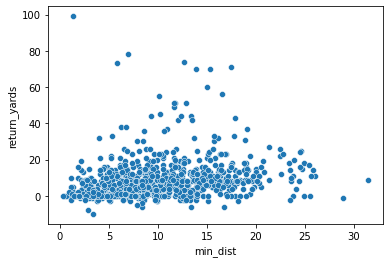

In [94]:
sns.scatterplot(data=min_dist, x='min_dist', y='return_yards')

# OLD

In [ ]:
play_df[(play_df.gameId==game_id) & (play_df.playId==play_id)].T

In [ ]:
temp_df[temp_df.event=='punt_received']

In [ ]:
track_df['event'].value_counts()

In [16]:
# get plays that have a fair catch
fc_track_df = track_df.loc[track_df['event']=='fair_catch', ['gameId', 'playId', 'frameId']].groupby(['gameId', 'playId']).first()
fc_track_df

frameId
gameId     playId         
2018090600 973          83
           2406         79
2018090900 4325         74
2018090901 2907         74
           3215         72
...                    ...
2018123013 2461         74
           2717         74
2018123015 127          75
           1397         75
           2395         79

[589 rows x 1 columns]

In [22]:
fc_track_df.loc[(2018090600, 973)]

frameId    83
Name: (2018090600, 973), dtype: int64

In [6]:
track_df.event[(track_df.gameId==game_id) & (track_df.playId==play_id)].unique()

array(['None', 'ball_snap', 'punt', 'punt_received', 'first_contact',
       'tackle'], dtype=object)

In [7]:
track_df.loc[(track_df.gameId==game_id) & (track_df.playId==play_id)].groupby('frameId').head(1)

,time,x,y,s,a,dis,o,dir,event,nflId,displayName,jerseyNumber,position,team,frameId,gameId,playId,playDirection
12070906,2018-09-07T01:18:14.000,13.74,31.11,0.01,0.02,0.00,67.95,141.34,None,32361.0,Corey Graham,24.0,FS,home,1,2018090600,366,right
12070907,2018-09-07T01:18:14.100,13.74,31.11,0.01,0.01,0.00,66.66,140.89,None,32361.0,Corey Graham,24.0,FS,home,2,2018090600,366,right
12070908,2018-09-07T01:18:14.200,13.75,31.11,0.01,0.01,0.01,65.65,139.83,None,32361.0,Corey Graham,24.0,FS,home,3,2018090600,366,right
12070909,2018-09-07T01:18:14.300,13.75,31.12,0.01,0.01,0.01,65.65,135.28,None,32361.0,Corey Graham,24.0,FS,home,4,2018090600,366,right
12070910,2018-09-07T01:18:14.400,13.76,31.12,0.01,0.01,0.01,67.05,131.67,None,32361.0,Corey Graham,24.0,FS,home,5,2018090600,366,right
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12071029,2018-09-07T01:18:26.300,69.99,51.31,5.27,3.60,0.47,27.99,21.19,None,32361.0,Corey Graham,24.0,FS,home,124,2018090600,366,right
12071030,2018-09-07T01:18:26.400,70.14,51.75,4.67,4.30,0.46,6.22,20.96,None,32361.0,Corey Graham,24.0,FS,home,125,2018090600,366,right
12071031,2018-09-07T01:18:26.500,70.28,52.13,4.11,4.32,0.40,353.54,20.84,None,32361.0,Corey Graham,24.0,FS,home,126,2018090600,366,right
12071032,2018-09-07T01:18:26.600,70.39,52.41,3.54,4.07,0.31,350.47,20.89,None,32361.0,Corey Graham,24.0,FS,home,127,2018090600,366,right


In [8]:
# game_id = 2018090600
# play_id = 75
x = track_df.loc[(track_df.gameId==game_id) & (track_df.playId==play_id)]
x.groupby(['gameId','playId']).filter(lambda df: np.all(df.event != 'qb_spike'))

,time,x,y,s,a,dis,o,dir,event,nflId,displayName,jerseyNumber,position,team,frameId,gameId,playId,playDirection
12070906,2018-09-07T01:18:14.000,13.74,31.11,0.01,0.02,0.00,67.95,141.34,None,32361.0,Corey Graham,24.0,FS,home,1,2018090600,366,right
12070907,2018-09-07T01:18:14.100,13.74,31.11,0.01,0.01,0.00,66.66,140.89,None,32361.0,Corey Graham,24.0,FS,home,2,2018090600,366,right
12070908,2018-09-07T01:18:14.200,13.75,31.11,0.01,0.01,0.01,65.65,139.83,None,32361.0,Corey Graham,24.0,FS,home,3,2018090600,366,right
12070909,2018-09-07T01:18:14.300,13.75,31.12,0.01,0.01,0.01,65.65,135.28,None,32361.0,Corey Graham,24.0,FS,home,4,2018090600,366,right
12070910,2018-09-07T01:18:14.400,13.76,31.12,0.01,0.01,0.01,67.05,131.67,None,32361.0,Corey Graham,24.0,FS,home,5,2018090600,366,right
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12073845,2018-09-07T01:18:26.300,69.11,51.15,2.65,4.30,0.19,NaN,NaN,None,NaN,football,NaN,NaN,football,124,2018090600,366,right
12073846,2018-09-07T01:18:26.400,69.14,51.37,2.29,4.16,0.23,NaN,NaN,None,NaN,football,NaN,NaN,football,125,2018090600,366,right
12073847,2018-09-07T01:18:26.500,69.19,51.59,1.96,3.81,0.22,NaN,NaN,None,NaN,football,NaN,NaN,football,126,2018090600,366,right
12073848,2018-09-07T01:18:26.600,69.24,51.76,1.62,3.36,0.18,NaN,NaN,None,NaN,football,NaN,NaN,football,127,2018090600,366,right


In [9]:
play_df.columns

Index(['gameId', 'playId', 'playDescription', 'quarter', 'down', 'yardsToGo',
       'possessionTeam', 'specialTeamsPlayType', 'specialTeamsResult',
       'kickerId', 'returnerId', 'kickBlockerId', 'yardlineSide',
       'yardlineNumber', 'gameClock', 'penaltyCodes', 'penaltyJerseyNumbers',
       'penaltyYards', 'preSnapHomeScore', 'preSnapVisitorScore', 'passResult',
       'kickLength', 'kickReturnYardage', 'playResult',
       'absoluteYardlineNumber'],
      dtype='object')

In [10]:
play_df

,gameId,playId,playDescription,quarter,down,yardsToGo,possessionTeam,specialTeamsPlayType,specialTeamsResult,kickerId,...,penaltyCodes,penaltyJerseyNumbers,penaltyYards,preSnapHomeScore,preSnapVisitorScore,passResult,kickLength,kickReturnYardage,playResult,absoluteYardlineNumber
0,2018090600,37,J.Elliott kicks 65 yards from PHI 35 to end zo...,1,0,0,PHI,Kickoff,Touchback,44966.0,...,NaN,NaN,NaN,0,0,NaN,66.0,NaN,40,45
1,2018090600,366,"(9:20) C.Johnston punts 56 yards to ATL 36, Ce...",1,4,4,PHI,Punt,Return,45603.0,...,UNSd,PHI 18,-15.0,0,0,NaN,56.0,5.0,36,18
2,2018090600,658,"(5:03) M.Bryant 21 yard field goal is GOOD, Ce...",1,4,3,ATL,Field Goal,Kick Attempt Good,27091.0,...,NaN,NaN,NaN,0,0,NaN,21.0,NaN,0,13
3,2018090600,677,M.Bosher kicks 64 yards from ATL 35 to PHI 1. ...,1,0,0,ATL,Kickoff,Return,37267.0,...,NaN,NaN,NaN,0,3,NaN,64.0,30.0,34,75
4,2018090600,872,"(:33) C.Johnston punts 65 yards to end zone, C...",1,4,18,PHI,Punt,Touchback,45603.0,...,NaN,NaN,NaN,0,3,NaN,65.0,NaN,45,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19974,2021010315,3683,J.Myers kicks 65 yards from SEA 35 to end zone...,4,0,0,SEA,Kickoff,Touchback,41175.0,...,NaN,NaN,NaN,16,19,NaN,75.0,NaN,40,75
19975,2021010315,3870,"J.Myers extra point is GOOD, Center-T.Ott, Hol...",4,0,0,SEA,Extra Point,Kick Attempt Good,41175.0,...,NaN,NaN,NaN,16,25,NaN,NaN,NaN,0,25
19976,2021010315,3886,J.Myers kicks 65 yards from SEA 35 to end zone...,4,0,0,SEA,Kickoff,Touchback,41175.0,...,NaN,NaN,NaN,16,26,NaN,75.0,NaN,40,75
19977,2021010315,4166,"T.Vizcaino extra point is GOOD, Center-C.Holba...",4,0,0,SF,Extra Point,Kick Attempt Good,47590.0,...,NaN,NaN,NaN,22,26,NaN,NaN,NaN,0,95
